In [410]:
try:
    import itertools
    import numpy as np
    import time
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns

    from sklearn.model_selection import train_test_split
    from sklearn.model_selection import cross_val_score
    from sklearn import tree
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.metrics import classification_report,confusion_matrix

    from IPython.display import Image  
    #from sklearn.externals.six import StringIO  
    from six import StringIO
    from sklearn.tree import export_graphviz
    import pydot 
    import time
    
    from typing import Optional, Tuple
    import numpy as np
    import matplotlib.pyplot as plt
    import pandas as pd
    # from yellowbrick.classifier import ConfusionMatrix, ClassificationReport
except Exception as e:
    print("One of the libraries was not installed")
    print(e)
    
%matplotlib inline

# Functions

In [411]:
def plot_classification_report(cr, title=None, cmap='RdBu'):
    """
    Adapted from https://medium.com/district-data-labs/visual-diagnostics-for-more-informed-machine-learning-7ec92960c96b
    """
    title = title or 'Classification report'
    lines = cr.split('\n')
    classes = []
    matrix = []
  
    for line in lines[2:(len(lines)-5)]:
        s = line.split()
        classes.append(s[0])
        value = [float(x) for x in s[1: len(s) - 1]]
        matrix.append(value)

    fig, ax = plt.subplots(1)

    for column in range(len(matrix)+1):
        for row in range(len(classes)):
            txt = matrix[row][column]
            #ax.text(column,row,matrix[row][column],va='center',ha='center')
            ax.text(column,row,txt,va='center',ha='center',size="x-large",bbox=dict(facecolor='white', alpha=0.5))

    fig = plt.imshow(matrix, interpolation='nearest', cmap=cmap, vmin=0, vmax=1)
    fig.figsize= (10,7)
    plt.title(title)
    plt.colorbar()
    x_tick_marks = np.arange(len(classes)+1)
    y_tick_marks = np.arange(len(classes))
    plt.xticks(x_tick_marks, ['Precision', 'Recall', 'F1-score'], rotation=45)
    plt.yticks(y_tick_marks, classes)
    plt.ylabel('Classes')
    plt.xlabel('Measures')
    plt.show()

In [412]:
def plot_path(sample_id, clf, X,Y):
    if isinstance(X, pd.DataFrame):
        X_values = X.values
        
    print("Actual Classification:",Y.iloc[sample_id])
    # First let's retrieve the decision path of each sample. The decision_path
    # method allows to retrieve the node indicator functions. A non zero element of
    # indicator matrix at the position (i, j) indicates that the sample i goes
    # through the node j.
    node_indicator = clf.decision_path(X_values)

    # Similarly, we can also have the leaves ids reached by each sample.
    leave_id = clf.apply(X_values)

    node_index = node_indicator.indices[
        node_indicator.indptr[sample_id]:
        node_indicator.indptr[sample_id + 1]
    ]

    print('Rules used to predict sample %s: ' % sample_id)
    for node_id in node_index:
        if leave_id[sample_id] == node_id:
            continue

        if (X_values[sample_id, feature[node_id]] <= threshold[node_id]):
            threshold_sign = "<="
        else:
            threshold_sign = ">"

        print("decision id node %s : (X[%s, %s (%s)] (= %s) %s %s)"
              % (node_id,
                 sample_id,
                 feature[node_id],
                 X.columns[feature[node_id]],
                 X_values[sample_id, feature[node_id]],
                 threshold_sign,
                 threshold[node_id]))
    print("Predicted  Classification:",clf1.predict(X.iloc[sample_id:sample_id+1]).tolist())

In [413]:
def find_common_nodes(sample_ids, clf, X, verbose=0):
    # For a group of samples, we have the following common node.
    
    if isinstance(X, pd.DataFrame):
        X_values = X.values
        
    # First let's retrieve the decision path of each sample. The decision_path
    # method allows to retrieve the node indicator functions. A non zero element of
    # indicator matrix at the position (i, j) indicates that the sample i goes
    # through the node j.
    node_indicator = clf.decision_path(X_values)
    
    n_nodes = clf.tree_.node_count

    common_nodes = (node_indicator.toarray()[sample_ids].sum(axis=0) == len(sample_ids)) # Common
    common_node_id = np.arange(n_nodes)[common_nodes]

    any_nodes    = (node_indicator.toarray()[sample_ids].sum(axis=0) >= 1)  # Present in at least 1 path

    percent_any_path_nodes   = 100 * len(common_node_id) / sum(any_nodes)
    percent_total_nodes = 100 * len(common_node_id) / n_nodes

    if verbose:
        print("\nThe following samples %s share the node %s in the tree" % (sample_ids, common_node_id))
        print(f"It is {percent_any_path_nodes} % of nodes in any of these sample paths.")
        print(f"It is {percent_total_nodes} % of all nodes.")
    return (percent_any_path_nodes, percent_total_nodes)

In [414]:
import skopt
skopt.__version__

'0.8.1'

In [415]:
import sklearn
sklearn.__version__

'0.23.2'

In [416]:
print(f"Executed at: {time.ctime()}")

Executed at: Sun Oct  4 18:23:28 2020


In [417]:
data = pd.read_csv("../../data/data.csv")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9348 entries, 0 to 9347
Data columns (total 30 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   isSpam         9348 non-null   object 
 1   isRe           9348 non-null   object 
 2   underscore     9348 non-null   object 
 3   priority       9348 non-null   object 
 4   isInReplyTo    9348 non-null   object 
 5   sortedRec      9348 non-null   object 
 6   subPunc        9348 non-null   object 
 7   multipartText  9348 non-null   object 
 8   hasImages      9348 non-null   object 
 9   isPGPsigned    9348 non-null   object 
 10  subSpamWords   9341 non-null   object 
 11  noHost         9347 non-null   object 
 12  numEnd         9348 non-null   object 
 13  isYelling      9341 non-null   object 
 14  isOrigMsg      9348 non-null   object 
 15  isDear         9348 non-null   object 
 16  isWrote        9348 non-null   object 
 17  numLines       9348 non-null   int64  
 18  bodyChar

# Converting boolean columns to right format

In [418]:
allBoolCols = data.select_dtypes(include='object').columns
allBoolCols

Index(['isSpam', 'isRe', 'underscore', 'priority', 'isInReplyTo', 'sortedRec',
       'subPunc', 'multipartText', 'hasImages', 'isPGPsigned', 'subSpamWords',
       'noHost', 'numEnd', 'isYelling', 'isOrigMsg', 'isDear', 'isWrote'],
      dtype='object')

In [419]:
for boolCol in allBoolCols:
    data = data.replace({boolCol: {'T': True, 'F': False}})
    data[boolCol] = data[boolCol].astype(bool) 

In [420]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9348 entries, 0 to 9347
Data columns (total 30 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   isSpam         9348 non-null   bool   
 1   isRe           9348 non-null   bool   
 2   underscore     9348 non-null   bool   
 3   priority       9348 non-null   bool   
 4   isInReplyTo    9348 non-null   bool   
 5   sortedRec      9348 non-null   bool   
 6   subPunc        9348 non-null   bool   
 7   multipartText  9348 non-null   bool   
 8   hasImages      9348 non-null   bool   
 9   isPGPsigned    9348 non-null   bool   
 10  subSpamWords   9348 non-null   bool   
 11  noHost         9348 non-null   bool   
 12  numEnd         9348 non-null   bool   
 13  isYelling      9348 non-null   bool   
 14  isOrigMsg      9348 non-null   bool   
 15  isDear         9348 non-null   bool   
 16  isWrote        9348 non-null   bool   
 17  numLines       9348 non-null   int64  
 18  bodyChar

In [421]:
data.head()

,isSpam,isRe,underscore,priority,isInReplyTo,sortedRec,subPunc,multipartText,hasImages,isPGPsigned,...,subQuesCt,numAtt,numRec,perCaps,hour,perHTML,subBlanks,forwards,avgWordLen,numDlr
0,False,True,False,False,True,True,False,False,False,False,...,0.0,0,2.0,4.451039,11,0.0,12.500000,0.000000,4.376623,3
1,False,False,False,False,False,True,False,False,False,False,...,0.0,0,1.0,7.491289,11,0.0,8.000000,0.000000,4.555556,0
2,False,False,False,False,False,True,False,False,False,False,...,0.0,0,1.0,7.436096,12,0.0,8.000000,0.000000,4.817164,0
3,False,False,False,False,False,True,False,False,False,False,...,0.0,0,0.0,5.090909,13,0.0,18.918919,3.125000,4.714286,0
4,False,True,False,False,False,True,False,False,False,False,...,0.0,0,1.0,6.116643,13,0.0,15.217391,6.451613,4.234940,0


<AxesSubplot:>

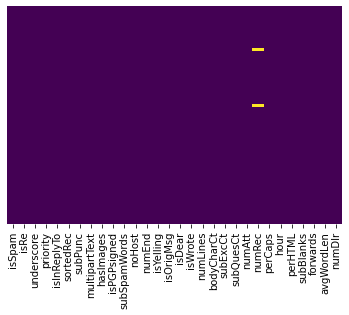

In [422]:
sns.heatmap(data.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [423]:
data.isnull().sum()

isSpam             0
isRe               0
underscore         0
priority           0
isInReplyTo        0
sortedRec          0
subPunc            0
multipartText      0
hasImages          0
isPGPsigned        0
subSpamWords       0
noHost             0
numEnd             0
isYelling          0
isOrigMsg          0
isDear             0
isWrote            0
numLines           0
bodyCharCt         0
subExcCt          20
subQuesCt         20
numAtt             0
numRec           282
perCaps            0
hour               0
perHTML            0
subBlanks         20
forwards           0
avgWordLen         0
numDlr             0
dtype: int64

In [424]:
missingCols = data.columns[data.isnull().sum() > 0]
missingCols

Index(['subExcCt', 'subQuesCt', 'numRec', 'subBlanks'], dtype='object')

In [425]:
data[missingCols].dtypes

subExcCt     float64
subQuesCt    float64
numRec       float64
subBlanks    float64
dtype: object

In [426]:
for missingCol in missingCols:
    print(missingCol)
    print(data[missingCol].unique())

subExcCt
[ 0.  1.  3.  2. nan  8.  4.  5. 42.]
subQuesCt
[ 0.  3.  1.  2.  4. nan  8. 12.  5.]
numRec
[  2.   1.   0.   3.   4.   5.   7.   6.  nan  11.  12.   8.  10.   9.
  46.  13.  15.  16.  45.  14.  19.  37.  48.  44.  30.  54.  18.  27.
  24.  47.  21.  68.  74. 311.  42.  43.  32.  34.  29.  25.  35.  23.
  28.  49.  75.  38.  17.  26.  22.  39.  36.  66.]
subBlanks
[12.5         8.         18.91891892 15.2173913  17.0212766   6.25
 11.11111111 10.63829787 14.89361702 15.55555556 17.64705882 12.
 11.86440678 12.12121212 10.         13.51351351 14.70588235 16.21621622
  9.09090909 13.46153846 14.28571429  0.          2.43902439 13.63636364
 15.38461538  5.88235294 17.07317073 13.79310345 19.04761905 17.39130435
 13.33333333  6.89655172 15.625      18.36734694 18.86792453 20.
 16.66666667 11.42857143 10.52631579 15.78947368 13.75       11.53846154
 20.83333333 20.58823529 14.58333333 14.81481481 16.36363636 11.76470588
 13.15789474 17.5        10.34482759 13.7254902  13.1147541  

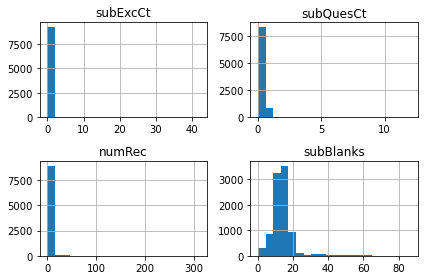

In [427]:
data[missingCols].hist(bins=20)
plt.tight_layout()

In [428]:
data[data.isnull().sum(axis=1).astype(bool)]

,isSpam,isRe,underscore,priority,isInReplyTo,sortedRec,subPunc,multipartText,hasImages,isPGPsigned,...,subQuesCt,numAtt,numRec,perCaps,hour,perHTML,subBlanks,forwards,avgWordLen,numDlr
1556,False,False,False,False,False,True,False,False,False,False,...,0.0,0,NaN,9.326425,22,0.00000,12.903230,0.000000,4.488372,0
1557,False,False,False,False,True,True,False,False,False,False,...,0.0,0,NaN,2.668446,22,0.00000,12.903230,48.888890,4.118132,0
1558,False,False,False,False,True,True,False,False,False,False,...,0.0,0,NaN,10.000000,22,0.00000,12.903230,28.571430,4.054054,0
1559,False,False,False,False,True,True,False,False,False,False,...,1.0,0,NaN,2.878465,2,0.00000,9.090909,9.090909,3.991489,0
1561,False,False,False,False,True,True,False,False,False,False,...,1.0,0,NaN,3.596560,2,0.00000,9.090909,0.000000,4.099359,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8551,True,False,True,False,False,True,False,False,False,False,...,0.0,0,NaN,6.771263,14,33.35946,14.634150,0.000000,3.755039,0
8624,True,False,False,False,False,True,False,False,False,False,...,NaN,0,1.0,6.995885,13,0.00000,NaN,0.000000,5.885813,0
8631,True,False,False,False,False,True,False,False,False,False,...,0.0,0,NaN,6.265256,18,35.09799,16.666670,0.000000,3.657738,0
8787,True,False,False,False,False,True,False,False,False,False,...,NaN,0,1.0,14.901050,22,0.00000,NaN,0.000000,4.585409,2


In [429]:
# TODO: We can impute the missing values, but we should be careful since some of them have been loaded as float, but should really be int
# For now, I will just remove them

In [430]:
data = data.dropna()
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9046 entries, 0 to 9347
Data columns (total 30 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   isSpam         9046 non-null   bool   
 1   isRe           9046 non-null   bool   
 2   underscore     9046 non-null   bool   
 3   priority       9046 non-null   bool   
 4   isInReplyTo    9046 non-null   bool   
 5   sortedRec      9046 non-null   bool   
 6   subPunc        9046 non-null   bool   
 7   multipartText  9046 non-null   bool   
 8   hasImages      9046 non-null   bool   
 9   isPGPsigned    9046 non-null   bool   
 10  subSpamWords   9046 non-null   bool   
 11  noHost         9046 non-null   bool   
 12  numEnd         9046 non-null   bool   
 13  isYelling      9046 non-null   bool   
 14  isOrigMsg      9046 non-null   bool   
 15  isDear         9046 non-null   bool   
 16  isWrote        9046 non-null   bool   
 17  numLines       9046 non-null   int64  
 18  bodyChar

In [431]:
# Takes a long time
# sns.pairplot(data, hue='isSpam', palette='Set1')

# EDA

## Following features show up on the higher end of the feature importance chart

In [432]:
dataEDA = data.copy()
dataEDA['numLines(log)'] = np.log10(dataEDA['numLines'])
dataEDA['bodyCharCt(log)'] = np.log10(dataEDA['bodyCharCt'])
dataEDA['numAtt(log)'] = np.log10(dataEDA['numAtt']+0.001)

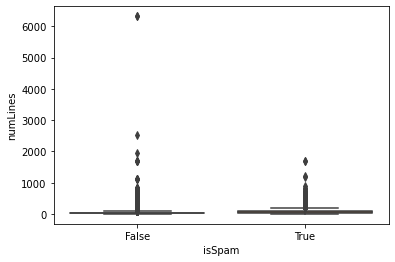

In [433]:
ax = sns.boxplot(x="isSpam", y="numLines", data=dataEDA)

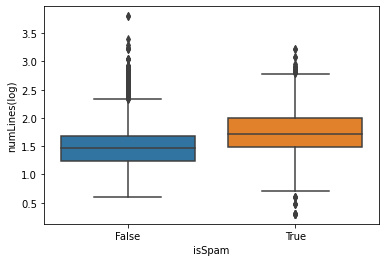

In [434]:
ax = sns.boxplot(x="isSpam", y="numLines(log)", data=dataEDA)

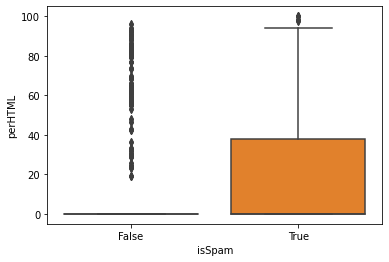

In [435]:
ax = sns.boxplot(x="isSpam", y="perHTML", data=dataEDA)

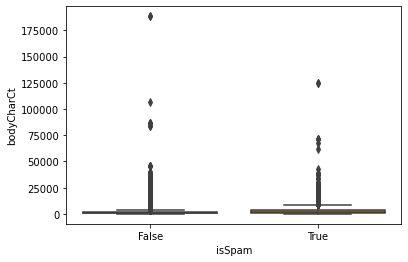

In [436]:
ax = sns.boxplot(x="isSpam", y="bodyCharCt", data=dataEDA)

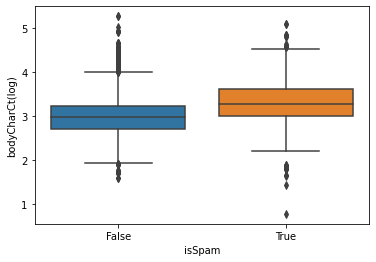

In [437]:
ax = sns.boxplot(x="isSpam", y="bodyCharCt(log)", data=dataEDA)

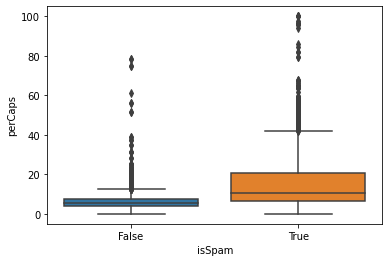

In [438]:
ax = sns.boxplot(x="isSpam", y="perCaps", data=dataEDA)

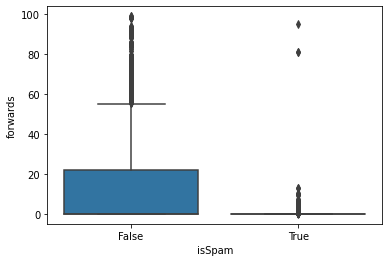

In [439]:
ax = sns.boxplot(x="isSpam", y="forwards", data=dataEDA)

## The following variable show up lower on the feature importance

<AxesSubplot:xlabel='isSpam'>

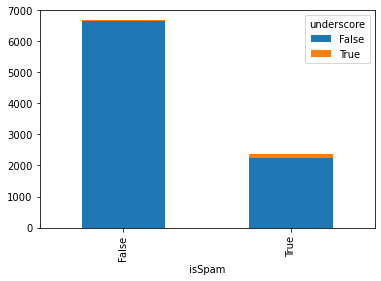

In [440]:
pd.crosstab(dataEDA['isSpam'], dataEDA['underscore']).plot(kind='bar', stacked=True)

<AxesSubplot:xlabel='isSpam'>

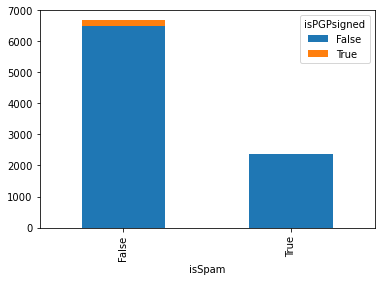

In [441]:
pd.crosstab(dataEDA['isSpam'], dataEDA['isPGPsigned']).plot(kind='bar', stacked=True)

<AxesSubplot:xlabel='isSpam'>

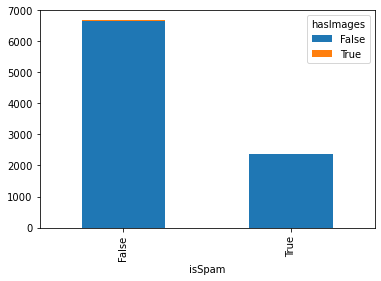

In [442]:
pd.crosstab(dataEDA['isSpam'], dataEDA['hasImages']).plot(kind='bar', stacked=True)

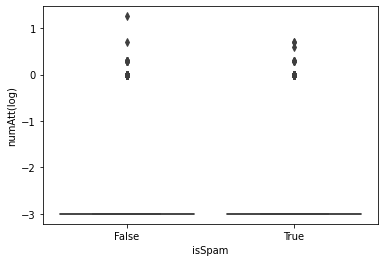

In [443]:
ax = sns.boxplot(x="isSpam", y="numAtt(log)", data=dataEDA)

# Train Test Split

In [444]:
X = data.drop('isSpam',axis=1)
y = data['isSpam']

In [445]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Baseline Decision Tree

In [446]:
# ?DecisionTreeClassifier

In [447]:
clf0 = DecisionTreeClassifier()
cross_val_score(clf0, X_train, y_train, scoring='f1', cv=10)

array([0.93866667, 0.94179894, 0.95090439, 0.91472868, 0.8994709 ,
       0.92146597, 0.90616622, 0.93085106, 0.93582888, 0.92140921])

In [448]:
clf0.fit(X_train, y_train)

DecisionTreeClassifier()

In [449]:
predictions = clf0.predict(X_test)

In [450]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

       False       0.98      0.98      0.98      1347
        True       0.94      0.94      0.94       463

    accuracy                           0.97      1810
   macro avg       0.96      0.96      0.96      1810
weighted avg       0.97      0.97      0.97      1810



In [451]:
# viz = ClassificationReport(clf0,  cmap='PuRd')
# viz.score(X_test, y_test)

In [452]:
print(confusion_matrix(y_test,predictions))
# cm = ConfusionMatrix(clf0, classes=['ham', 'spam'])
# cm.score(X_test, y_test)
# cm.show()

[[1321   26]
 [  28  435]]


## Feature Importance (Global)

https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier.decision_path

In [453]:
# Option 1
clf0.feature_importances_

array([0.0016836 , 0.        , 0.        , 0.03790348, 0.00322752,
       0.00195991, 0.02030853, 0.00129685, 0.        , 0.01254252,
       0.00199384, 0.01761444, 0.01240118, 0.00215819, 0.02125176,
       0.00740536, 0.09799423, 0.10910435, 0.02461046, 0.00075222,
       0.0025749 , 0.01074602, 0.26811531, 0.01571161, 0.10185125,
       0.06006872, 0.05574343, 0.04579315, 0.06518717])

In [454]:
# Option 2
from sklearn.inspection import permutation_importance
importances = permutation_importance(clf0, X_train, y_train, n_repeats=10, random_state=0)
indices = np.argsort(importances.importances_mean)[::-1]

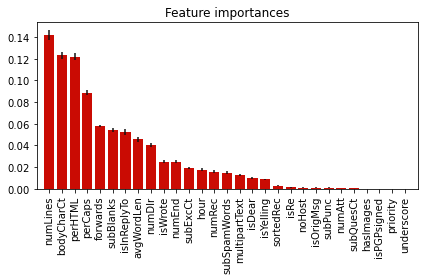

In [455]:
# https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html#sphx-glr-auto-examples-ensemble-plot-forest-importances-py
# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(
    range(X_train.shape[1]),
    importances.importances_mean[indices],
    color="r",
    yerr=importances.importances_std[indices],
    align="center"
)
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.tight_layout()
plt.show()

In [456]:
# https://scikit-learn.org/stable/auto_examples/tree/plot_iris_dtc.html#sphx-glr-auto-examples-tree-plot-iris-dtc-py
# Show a Grid with pairs of important predictors and pairs of not so good predictors

In [457]:
indices

array([16, 17, 24, 22, 26, 25,  3, 27, 28, 15, 11, 18, 23, 21,  9,  6, 14,
       12,  4,  0, 10, 13,  5, 20, 19,  7,  8,  2,  1], dtype=int64)

In [458]:
# # Parameters
# n_classes = 2
# plot_colors = "gb"
# plot_step = 5

# plt.figure(figsize=(12,12))
# plt.title("Decision surface of a decision tree using paired features")

# for pairidx, pair in enumerate([[16, 24], [16, 17], [16, 22], [16, 26], [24, 17], [24, 22], # Good Features
#                                 [20, 21], [20, 18]
#                                ]): 
#     # We only take the two corresponding features
#     X = X_train.values[:, pair]
#     y = y_train.astype(int).values

#     # Train
#     clf = DecisionTreeClassifier(min_samples_split=20, min_samples_leaf=5).fit(X, y)

#     # plot_tree(clf, filled=True)
        
#     # Plot the decision boundary
#     plt.subplot(4, 2, pairidx + 1)

#     x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
#     y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
#     xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
#                          np.arange(y_min, y_max, plot_step))
#     plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

#     Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
#     Z = Z.reshape(xx.shape)
#     cs = plt.contourf(xx, yy, Z, cmap=plt.cm.GnBu)# 'viridis')#plt.cm.RdYlBu)

#     plt.xlabel(X_train.columns[pair[0]])
#     plt.ylabel(X_train.columns[pair[1]])

#     # Plot the training points
#     for i, color in zip(range(n_classes), plot_colors):
#         idx = np.where(y_test.astype(int).values == i)
#         plt.scatter(X_test.values[:, pair][idx, 0], X_test.values[:, pair][idx, 1], c=color, label=np.array(['ham', 'spam'][i]),
#                     edgecolor='black', s=15)
    
#     plt.legend(loc='lower right', borderpad=0, handletextpad=0)
#     plt.axis("tight")
#     plt.tight_layout()

# plt.show()


In [459]:
# https://github.com/tirthajyoti/Machine-Learning-with-Python/blob/master/Utilities/ML-Python-utils.py

from typing import Optional, Tuple
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


def plot_decision_boundaries(
    X, y,
    model_class,
    feature_names: Optional[Tuple[str, str]]=None,
    num_points: int=100,
    actual_only:bool=False,
    ax=None,
    **model_params):
    """
    Function to plot the decision boundaries of a classification model.
    This uses just the first two columns of the data for fitting 
    the model as we need to find the predicted value for every point in 
    scatter plot.
    Arguments:
            X: Feature data as a NumPy-type array.
            y: Label data as a NumPy-type array.
            model_class: A Scikit-learn ML estimator class 
            e.g. GaussianNB (imported from sklearn.naive_bayes) or
            LogisticRegression (imported from sklearn.linear_model)
            **model_params: Model parameters to be passed on to the ML estimator
            feature_names: The names of the 2 features used to plot the data
            num_points: NUmber of points to plot on each axis of the mesh grid
            
    Typical code example:
            plt.figure()
            plt.title("KNN decision boundary with neighbros: 5",fontsize=16)
            plot_decision_boundaries(X_train,y_train,KNeighborsClassifier,n_neighbors=5)
            plt.show()
    """
    try:
        X = np.array(X)
        y = np.array(y).flatten()
    except:
        print("Coercing input data to NumPy arrays failed")
    # Reduces to the first two columns of data
    reduced_data = X[:, :2]
    # Instantiate the model object
    model = model_class(**model_params)
    # Fits the model with the reduced data
    model.fit(reduced_data, y)

    # Plot the decision boundary. For that, we will assign a color to each
    x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
    y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
    
    # Step size of the mesh. Decrease to increase the quality of the VQ.
    hx = x_max/num_points  # point in the mesh [x_min, m_max]x[y_min, y_max].   
    hy = y_max/num_points
    
    # Meshgrid creation
    xx, yy = np.meshgrid(np.arange(x_min, x_max, hx),
                         np.arange(y_min, y_max, hy))

    # Predictions to obtain the classification results
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

    # Plotting
    if ax is None:
        if actual_only is False:
            plt.contourf(xx, yy, Z, alpha=0.4)
        # plt.scatter(X[:, 0], X[:, 1], c=y, alpha=0.8)
        plt.hexbin(X[:, 0], X[:, 1], C=y, gridsize=25, alpha=0.8)
        if feature_names is None:
            plt.xlabel("Feature-1",fontsize=15)
            plt.ylabel("Feature-2",fontsize=15)
        else:
            plt.xlabel(feature_names[0],fontsize=15)
            plt.ylabel(feature_names[1],fontsize=15)

        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        return plt
    else:
        if actual_only is False:
            ax.contourf(xx, yy, Z, alpha=0.4)
        # ax.scatter(X[:, 0], X[:, 1], c=y, alpha=0.8)
        ax.hexbin(X[:, 0], X[:, 1], C=y, gridsize=25, alpha=0.8)
        if feature_names is None:
            ax.set_xlabel("Feature-1",fontsize=15)
            ax.set_ylabel("Feature-2",fontsize=15)
        else:
            ax.set_xlabel(feature_names[0],fontsize=15)
            ax.set_ylabel(feature_names[1],fontsize=15)

        ax.tick_params(axis='both', which='major', labelsize=14)
        return ax
        

In [460]:
numericOrderedColNames = []
numericOrderedColIndices = []
for index in indices:
    columnName = X_train.columns[index]    
    if X_train[columnName].dtype == np.float64 or X_train[columnName].dtype == np.int64:         
        #print(f"{index}: {X_train.columns[index]} --> {X_train[columnName].dtype} --> Numeric")
        numericOrderedColNames.append(columnName)
        numericOrderedColIndices.append(index)
    else:
        #print(f"{index}: {X_train.columns[index]} --> {X_train[columnName].dtype} --> Not")
        pass

print("")
print(numericOrderedColNames)
print(numericOrderedColIndices)


['numLines', 'bodyCharCt', 'perHTML', 'perCaps', 'forwards', 'subBlanks', 'avgWordLen', 'numDlr', 'subExcCt', 'hour', 'numRec', 'numAtt', 'subQuesCt']
[16, 17, 24, 22, 26, 25, 27, 28, 18, 23, 21, 20, 19]


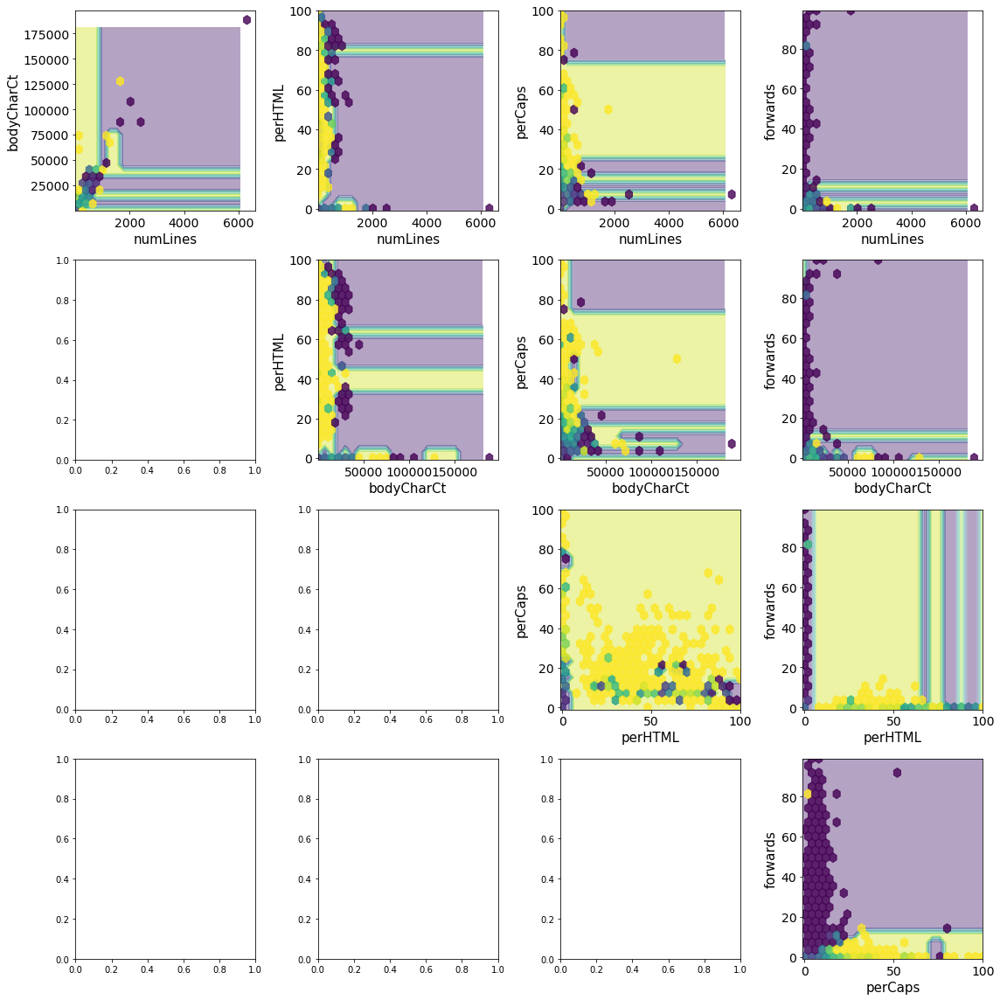

In [461]:
top = 5
fig, axes = plt.subplots(top-1, top-1, figsize=((top-1)*4, (top-1)*4))
for pairidx, pair_indices in enumerate(itertools.product(range(0, top), range(0, top))):
    if pair_indices[0] < pair_indices[1]:
        ax = axes[pair_indices[0], pair_indices[1]-1]
        colNames = X_train.columns[[numericOrderedColIndices[pair_indices[0]], numericOrderedColIndices[pair_indices[1]]]]
        _ = plot_decision_boundaries(
            X_train[colNames], y_train,
            DecisionTreeClassifier,
            feature_names=colNames,
            num_points=25,
            actual_only=False,
            ax = ax,
            random_state=42
        )
plt.tight_layout()
plt.show()

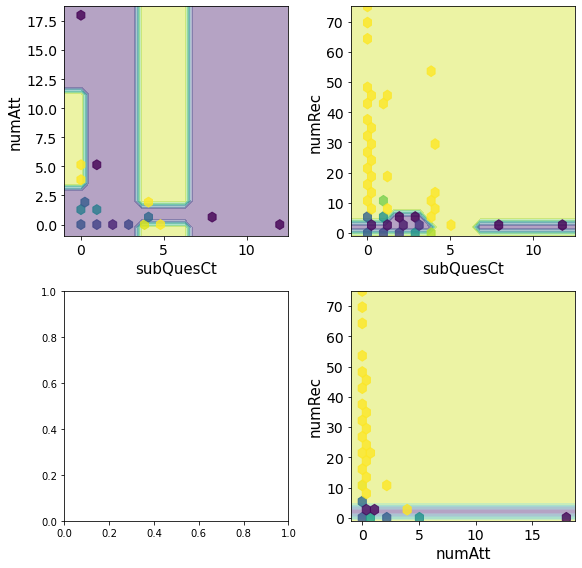

In [462]:
bottom = 3
fig, axes = plt.subplots(bottom-1, bottom-1, figsize=((bottom-1)*4, (bottom-1)*4))
for pairidx, pair_indices in enumerate(itertools.product(range(0, bottom), range(0, bottom))):
    if pair_indices[0] < pair_indices[1]:
        ax = axes[pair_indices[0], pair_indices[1]-1]
        colNames = X_train.columns[
            [numericOrderedColIndices[-(pair_indices[0]+1)], numericOrderedColIndices[-(pair_indices[1]+1)]]
        ]
        _ = plot_decision_boundaries(
            X_train[colNames], y_train,
            DecisionTreeClassifier,
            feature_names=colNames,
            num_points=25,
            actual_only=False,
            ax = ax,
            random_state=42
        )
plt.tight_layout()
plt.show()

## Feature Importance (Local)

TODO: Try LIME or Shapley

## Tree Visualization

https://mljar.com/blog/visualize-decision-tree/

In [463]:
text_representation = tree.export_text(clf0)
#print(text_representation)

In [464]:
features = list(data.columns[1:])
print(features)

['isRe', 'underscore', 'priority', 'isInReplyTo', 'sortedRec', 'subPunc', 'multipartText', 'hasImages', 'isPGPsigned', 'subSpamWords', 'noHost', 'numEnd', 'isYelling', 'isOrigMsg', 'isDear', 'isWrote', 'numLines', 'bodyCharCt', 'subExcCt', 'subQuesCt', 'numAtt', 'numRec', 'perCaps', 'hour', 'perHTML', 'subBlanks', 'forwards', 'avgWordLen', 'numDlr']


In [465]:
# ?tree.plot_tree

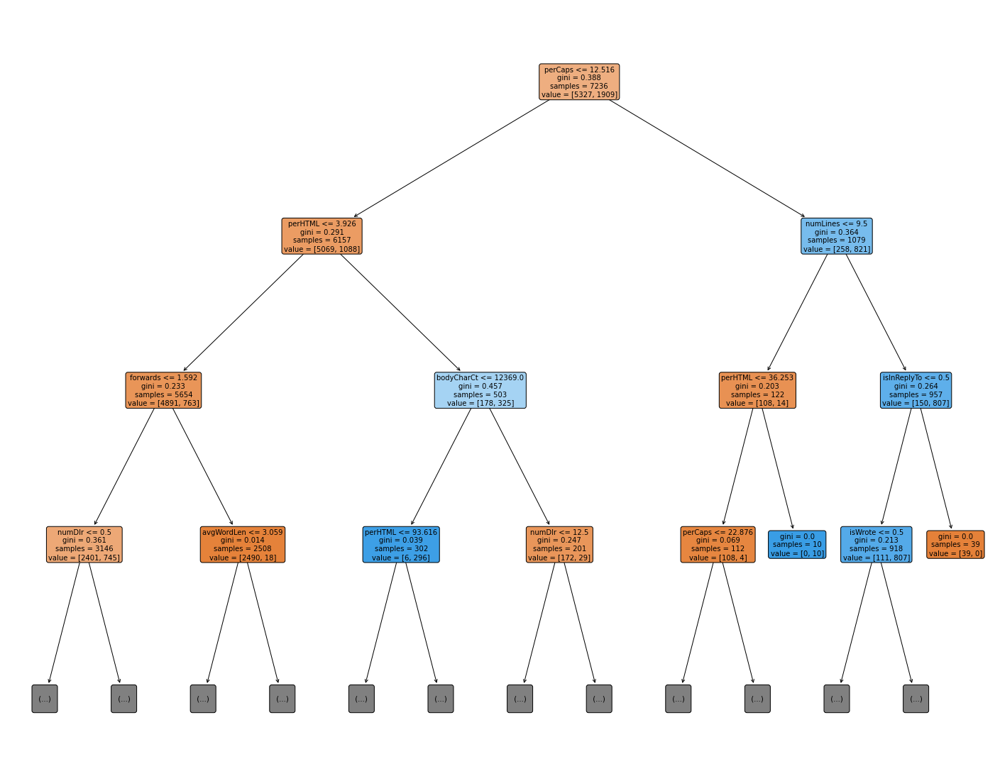

In [466]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(
    clf0, 
    max_depth=3,
    feature_names=features, 
    fontsize=10,
    # class_names=['ham', 'spam'],
    filled=True, rounded=True
)

In [467]:
fig.savefig("decistion_tree.png")

In [468]:
import pydot
dot_data = StringIO()  
export_graphviz(clf0, out_file=dot_data, feature_names=features, filled=True, rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())
# plt.savefig('output.png', dpi=300)

In [469]:
# dotfile = open("./tree.dot", 'w')
# tree.export_graphviz(dtree, out_file = dotfile, feature_names = features)
# dotfile.close()

## Decision Path

In [470]:
clf0.decision_path(X_train.values[0].reshape(1,-1))

<1x583 sparse matrix of type '<class 'numpy.int64'>'
	with 10 stored elements in Compressed Sparse Row format>

In [471]:
# https://scikit-learn.org/stable/auto_examples/tree/plot_unveil_tree_structure.html#sphx-glr-auto-examples-tree-plot-unveil-tree-structure-py

# The decision estimator has an attribute called tree_  which stores the entire
# tree structure and allows access to low level attributes. The binary tree
# tree_ is represented as a number of parallel arrays. The i-th element of each
# array holds information about the node `i`. Node 0 is the tree's root. NOTE:
# Some of the arrays only apply to either leaves or split nodes, resp. In this
# case the values of nodes of the other type are arbitrary!
#
# Among those arrays, we have:
#   - left_child, id of the left child of the node
#   - right_child, id of the right child of the node
#   - feature, feature used for splitting the node
#   - threshold, threshold value at the node
#

# Using those arrays, we can parse the tree structure:

n_nodes = clf0.tree_.node_count
children_left = clf0.tree_.children_left
children_right = clf0.tree_.children_right
feature = clf0.tree_.feature
threshold = clf0.tree_.threshold

print(f" n_nodes: {n_nodes}")
# print(f" children_left: {children_left}")
# print(f" children_right: {children_right}")
# print(f" feature: {feature}")
# print(f" threshold: {threshold}")

 n_nodes: 583


In [472]:
# The tree structure can be traversed to compute various properties such
# as the depth of each node and whether or not it is a leaf.
node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
is_leaves = np.zeros(shape=n_nodes, dtype=bool)
stack = [(0, -1)]  # seed is the root node id and its parent depth
while len(stack) > 0:
    node_id, parent_depth = stack.pop()
    node_depth[node_id] = parent_depth + 1

    # If we have a test node
    if (children_left[node_id] != children_right[node_id]):
        stack.append((children_left[node_id], parent_depth + 1))
        stack.append((children_right[node_id], parent_depth + 1))
    else:
        is_leaves[node_id] = True

print(f"The binary tree structure has {n_nodes} nodes and has the following tree structure:")
for i in range(n_nodes):
    if is_leaves[i]:
        print("%snode=%s leaf node." % (node_depth[i] * " ", i))
    else:
        print("%snode=%s test node: go to node %s if X[:, %s] <= %s else to "
              "node %s."
              % (node_depth[i] * " ",
                 i,
                 children_left[i],
                 feature[i],
                 threshold[i],
                 children_right[i],
                 ))
print()

The binary tree structure has 583 nodes and has the following tree structure:
node=0 test node: go to node 1 if X[:, 22] <= 12.515614986419678 else to node 476.
 node=1 test node: go to node 2 if X[:, 24] <= 3.9264414310455322 else to node 445.
  node=2 test node: go to node 3 if X[:, 26] <= 1.5920854806900024 else to node 420.
   node=3 test node: go to node 4 if X[:, 28] <= 0.5 else to node 303.
    node=4 test node: go to node 5 if X[:, 25] <= 24.796239852905273 else to node 302.
     node=5 test node: go to node 6 if X[:, 18] <= 0.5 else to node 267.
      node=6 test node: go to node 7 if X[:, 6] <= 0.5 else to node 238.
       node=7 test node: go to node 8 if X[:, 14] <= 0.5 else to node 237.
        node=8 test node: go to node 9 if X[:, 11] <= 0.5 else to node 200.
         node=9 test node: go to node 10 if X[:, 12] <= 0.5 else to node 195.
          node=10 test node: go to node 11 if X[:, 27] <= 2.7698200941085815 else to node 12.
           node=11 leaf node.
           no

In [473]:
# Now, it's possible to get the tests that were used to predict a sample or
# a group of samples. First, let's make it for the sample.
sample_id = 0
plot_path(0, clf0, X_test, y_test)

Actual Classification: False
Rules used to predict sample 0: 
decision id node 0 : (X[0, 22 (perCaps)] (= 6.340058) <= 12.515614986419678)
decision id node 1 : (X[0, 24 (perHTML)] (= 0.0) <= 3.9264414310455322)
decision id node 2 : (X[0, 26 (forwards)] (= 53.84615) > 1.5920854806900024)
decision id node 420 : (X[0, 27 (avgWordLen)] (= 3.9885059999999997) > 3.0593059062957764)
decision id node 422 : (X[0, 25 (subBlanks)] (= 14.814810000000001) <= 30.8712100982666)
decision id node 423 : (X[0, 14 (isDear)] (= False) <= 0.5)
decision id node 424 : (X[0, 26 (forwards)] (= 53.84615) > 5.814739465713501)
decision id node 438 : (X[0, 6 (multipartText)] (= False) <= 0.5)
Predicted  Classification: [False]


In [474]:
plot_path(1, clf0, X_test,y_test)

Actual Classification: False
Rules used to predict sample 1: 
decision id node 0 : (X[1, 22 (perCaps)] (= 8.962264150943401) <= 12.515614986419678)
decision id node 1 : (X[1, 24 (perHTML)] (= 0.0) <= 3.9264414310455322)
decision id node 2 : (X[1, 26 (forwards)] (= 0.0) <= 1.5920854806900024)
decision id node 3 : (X[1, 28 (numDlr)] (= 0) <= 0.5)
decision id node 4 : (X[1, 25 (subBlanks)] (= 16.363636363636402) <= 24.796239852905273)
decision id node 5 : (X[1, 18 (subExcCt)] (= 0.0) <= 0.5)
decision id node 6 : (X[1, 6 (multipartText)] (= False) <= 0.5)
decision id node 7 : (X[1, 14 (isDear)] (= False) <= 0.5)
decision id node 8 : (X[1, 11 (numEnd)] (= False) <= 0.5)
decision id node 9 : (X[1, 12 (isYelling)] (= False) <= 0.5)
decision id node 10 : (X[1, 27 (avgWordLen)] (= 5.72972972972973) > 2.7698200941085815)
decision id node 12 : (X[1, 21 (numRec)] (= 1.0) > 0.5)
decision id node 16 : (X[1, 9 (subSpamWords)] (= False) <= 0.5)
decision id node 17 : (X[1, 27 (avgWordLen)] (= 5.7297297

In [475]:
plot_path(2, clf0, X_test,y_test)

Actual Classification: False
Rules used to predict sample 2: 
decision id node 0 : (X[2, 22 (perCaps)] (= 6.927175999999999) <= 12.515614986419678)
decision id node 1 : (X[2, 24 (perHTML)] (= 0.0) <= 3.9264414310455322)
decision id node 2 : (X[2, 26 (forwards)] (= 0.0) <= 1.5920854806900024)
decision id node 3 : (X[2, 28 (numDlr)] (= 0) <= 0.5)
decision id node 4 : (X[2, 25 (subBlanks)] (= 18.181820000000002) <= 24.796239852905273)
decision id node 5 : (X[2, 18 (subExcCt)] (= 0.0) <= 0.5)
decision id node 6 : (X[2, 6 (multipartText)] (= False) <= 0.5)
decision id node 7 : (X[2, 14 (isDear)] (= False) <= 0.5)
decision id node 8 : (X[2, 11 (numEnd)] (= False) <= 0.5)
decision id node 9 : (X[2, 12 (isYelling)] (= False) <= 0.5)
decision id node 10 : (X[2, 27 (avgWordLen)] (= 4.468254) > 2.7698200941085815)
decision id node 12 : (X[2, 21 (numRec)] (= 2.0) > 0.5)
decision id node 16 : (X[2, 9 (subSpamWords)] (= False) <= 0.5)
decision id node 17 : (X[2, 27 (avgWordLen)] (= 4.468254) <= 5.26

In [476]:
y_test.head()

1263    False
93      False
3452    False
6292    False
8102     True
Name: isSpam, dtype: bool

In [477]:
sample_ids = [0, 0]
_ = find_common_nodes(sample_ids, clf0, X_test, verbose=1)

sample_ids = [0, 1]
_ = find_common_nodes(sample_ids, clf0, X_test, verbose=1)

sample_ids = [0, 2]
_ = find_common_nodes(sample_ids, clf0, X_test, verbose=1)

sample_ids = [2, 3]
_ = find_common_nodes(sample_ids, clf0, X_test, verbose=1)

sample_ids = [1, 5]
_ = find_common_nodes(sample_ids, clf0, X_test, verbose=1)


The following samples [0, 0] share the node [  0   1   2 420 422 423 424 438 439] in the tree
It is 100.0 % of nodes in any of these sample paths.
It is 1.5437392795883362 % of all nodes.

The following samples [0, 1] share the node [0 1 2] in the tree
It is 11.538461538461538 % of nodes in any of these sample paths.
It is 0.5145797598627787 % of all nodes.

The following samples [0, 2] share the node [0 1 2] in the tree
It is 11.11111111111111 % of nodes in any of these sample paths.
It is 0.5145797598627787 % of all nodes.

The following samples [2, 3] share the node [0 1 2] in the tree
It is 11.11111111111111 % of nodes in any of these sample paths.
It is 0.5145797598627787 % of all nodes.

The following samples [1, 5] share the node [ 0  1  2  3  4  5  6  7  8  9 10 12 16 17] in the tree
It is 43.75 % of nodes in any of these sample paths.
It is 2.4013722126929675 % of all nodes.


In [478]:
class_vals = y_train.unique()
class_vals

array([ True, False])

In [479]:
size = int(len(X_test)/20)
common_array = np.zeros((size, size))
both_true_array = np.zeros((size, size))
both_false_array = np.zeros((size, size))
one_true_one_false = np.zeros((size, size))
print(common_array.shape)
for i in np.arange(0, size):
    for j in np.arange(0, size):
        common_array[i, j], _ = find_common_nodes([i, j], clf0, X_test, verbose=0)
        if y_test.values[i] == y_test.values[j]:
            if y_test.values[i]:
                both_true_array[i, j] = 1
            else:
                both_false_array[i, j] = 1
        else:
            one_true_one_false[i, j] = 1        

(90, 90)


In [480]:
common_array

array([[100.        ,  11.53846154,  11.11111111, ...,  25.        ,
         14.28571429,  14.28571429],
       [ 11.53846154, 100.        ,  51.85185185, ...,  18.18181818,
         12.90322581,   8.        ],
       [ 11.11111111,  51.85185185, 100.        , ...,  17.39130435,
         12.5       ,   7.69230769],
       ...,
       [ 25.        ,  18.18181818,  17.39130435, ..., 100.        ,
         31.25      ,  18.18181818],
       [ 14.28571429,  12.90322581,  12.5       , ...,  31.25      ,
        100.        ,  10.        ],
       [ 14.28571429,   8.        ,   7.69230769, ...,  18.18181818,
         10.        , 100.        ]])

In [481]:
print(both_true_array.sum())
both_true_array

729.0


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [482]:
print(both_false_array.sum())
both_false_array

3969.0


array([[1., 1., 1., ..., 1., 1., 0.],
       [1., 1., 1., ..., 1., 1., 0.],
       [1., 1., 1., ..., 1., 1., 0.],
       ...,
       [1., 1., 1., ..., 1., 1., 0.],
       [1., 1., 1., ..., 1., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [483]:
print(one_true_one_false.sum())
one_true_one_false

3402.0


array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [1., 1., 1., ..., 1., 1., 0.]])

In [484]:
common_true = (common_array * both_true_array).reshape(-1)
common_true = common_true[(common_true != 0) & (common_true != 100)]
common_false = (common_array * both_false_array).reshape(-1)
common_false = common_false[(common_false != 0) & (common_false != 100)]
common_both = (common_array * one_true_one_false).reshape(-1)
common_both = common_both[(common_both != 0) & (common_both != 100)]

In [485]:
print(np.sum(common_true != 0))
print(np.sum(common_false != 0))
print(np.sum(common_both != 0))

640
3086
3402


In [486]:
common_true = pd.DataFrame({'type': 'BothTrue', 'PercentCommon':common_true})
common_false = pd.DataFrame({'type': 'BothFalse', 'PercentCommon':common_false})
common_both = pd.DataFrame({'type': 'OneTrueOneFalse', 'PercentCommon':common_both})

In [487]:
frames = [common_true, common_false, common_both]
all_common = pd.concat(frames)

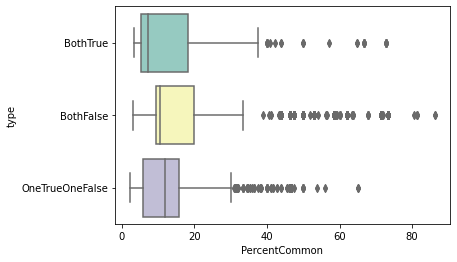

In [488]:
ax = sns.boxplot(y="type", x="PercentCommon",
                 data=all_common, palette="Set3")

# Hyperparameter Optimization

## Bayesian Method

In [489]:
from skopt.space import Real, Integer
from skopt.utils import use_named_args

In [490]:
# ?DecisionTreeClassifier

# criterion='gini',
# splitter='best',
# max_depth=None,
# min_samples_split=2,
# min_samples_leaf=1,
# min_weight_fraction_leaf=0.0,
# max_features=None,
# random_state=None,
# max_leaf_nodes=None,
# min_impurity_decrease=0.0,
# min_impurity_split=None,
# class_weight=None,
# presort='deprecated',
# ccp_alpha=0.0,

In [491]:
n_features = X_train.shape[1]

space  = [
    Integer(1, 100, name='max_depth'),
    Integer(1, n_features, name='max_features'),
    Real(0, 1, name='ccp_alpha'),
    Integer(2, 100, name='min_samples_split'),
    Integer(1, 100, name='min_samples_leaf')
]

# this decorator allows your objective function to receive a the parameters as
# keyword arguments. This is particularly convenient when you want to set
# scikit-learn estimator parameters

@use_named_args(space)
def objective_OLD(**params):
    dtree = DecisionTreeClassifier()
    dtree.set_params(**params)
    return -np.mean(cross_val_score(dtree, X_train, y_train, cv=3, n_jobs=-1, scoring="f1"))

@use_named_args(space)
def objective(**params):
    #dtree = DecisionTreeClassifier(class_weight="balanced")
    dtree = DecisionTreeClassifier()
    dtree.set_params(**params)
    scoring = {'precision_positive_only': make_scorer(precision_score, average='binary') # Positive Class Only https://scikit-learn.org/stable/modules/generated/sklearn.metrics.recall_score.html
               ,'f1_weighted': make_scorer(f1_score, average='weighted') # Weighted Score
                  }
    
    cv_results = cross_validate(dtree, X_train, y_train, cv=3, scoring = scoring, n_jobs=-1)
    loss = -np.mean(cv_results['test_precision_positive_only'] + cv_results['test_f1_weighted'])
    #loss = -np.mean(cv_results['test_recall_positive_only'])
    return loss

In [492]:
# ?gp_minimize

In [493]:
from skopt import gp_minimize
from sklearn.metrics import f1_score, recall_score, accuracy_score, precision_score, mean_squared_error, make_scorer
from sklearn.model_selection import cross_validate
res_gp = gp_minimize(objective, space, n_calls=150, random_state=42)

C:\Users\annam\Anaconda3\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
C:\Users\annam\Anaconda3\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
C:\Users\annam\Anaconda3\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
C:\Users\annam\Anaconda3\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
C:\Users\annam\Anaconda3\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
C:\Users\annam\

In [494]:
# Best Parameters
#print(f"Best Score (f1): {round(-res_gp.fun,2)}")
print(f"Best Score (weighted f1 + precision for positive class): {round(-res_gp.fun,2)}")
print("Best Parameters:")
for i in np.arange(0,len(space)):
    print(f"\t{space[i].name}: {res_gp.x[i]}")

Best Score (weighted f1 + precision for positive class): 1.87
Best Parameters:
	max_depth: 73
	max_features: 26
	ccp_alpha: 0.0
	min_samples_split: 2
	min_samples_leaf: 1


<AxesSubplot:title={'center':'Convergence plot'}, xlabel='Number of calls $n$', ylabel='$\\min f(x)$ after $n$ calls'>

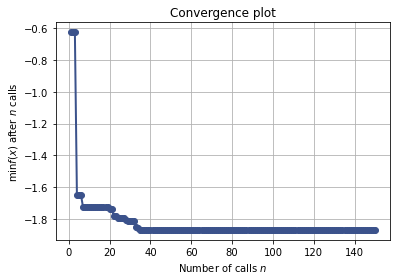

In [495]:
from skopt.plots import plot_convergence
plot_convergence(res_gp)

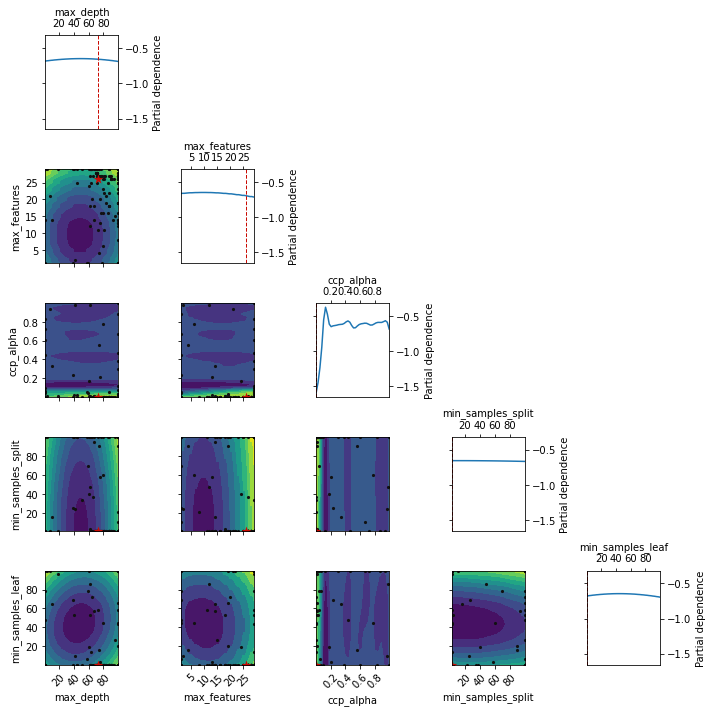

In [496]:
from skopt.plots import plot_objective
plot_objective(res_gp, size=2)
plt.tight_layout()

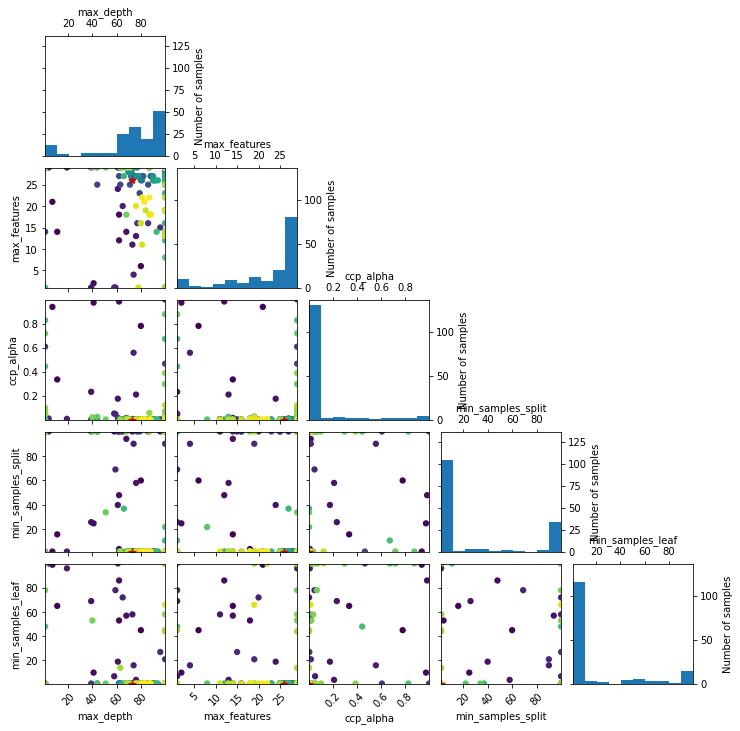

In [497]:
from skopt.plots import plot_evaluations
_ = plot_evaluations(res_gp, bins=10)

In [498]:
# Best Parameters
print(f"Best Score (weighted f1 + precision for positive class): {round(-res_gp.fun,2)}")
print("Best Parameters:")
for i in np.arange(0,len(space)):
    print(f"\t{space[i].name}: {res_gp.x[i]}")

Best Score (weighted f1 + precision for positive class): 1.87
Best Parameters:
	max_depth: 73
	max_features: 26
	ccp_alpha: 0.0
	min_samples_split: 2
	min_samples_leaf: 1


In [499]:
clf1 = DecisionTreeClassifier()
print(clf1)
kw_param = {}
for i in np.arange(0,len(space)):
    kw_param[space[i].name] = res_gp.x[i]
clf1.set_params(**kw_param)
print(clf1)

DecisionTreeClassifier()
DecisionTreeClassifier(max_depth=73, max_features=26)


In [500]:
clf1.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=73, max_features=26)

In [501]:
predictions = clf1.predict(X_test)
predictions_prob = clf1.predict_proba(X_test)

In [502]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

       False       0.98      0.98      0.98      1347
        True       0.95      0.94      0.94       463

    accuracy                           0.97      1810
   macro avg       0.96      0.96      0.96      1810
weighted avg       0.97      0.97      0.97      1810



In [503]:
print(confusion_matrix(y_test,predictions))

[[1322   25]
 [  26  437]]


C:\Users\annam\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)
C:\Users\annam\Anaconda3\lib\site-packages\yellowbrick\classifier\base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  YellowbrickWarning,


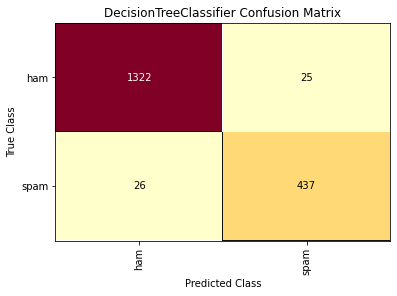

<AxesSubplot:title={'center':'DecisionTreeClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [504]:
# print(confusion_matrix(y_test,predictions))
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport
cm = ConfusionMatrix(clf1, classes=['ham', 'spam'])
cm.score(X_test, y_test)
cm.show()

## Classification Report

              precision    recall  f1-score   support

       False       0.98      0.98      0.98      1347
        True       0.95      0.94      0.94       463

    accuracy                           0.97      1810
   macro avg       0.96      0.96      0.96      1810
weighted avg       0.97      0.97      0.97      1810



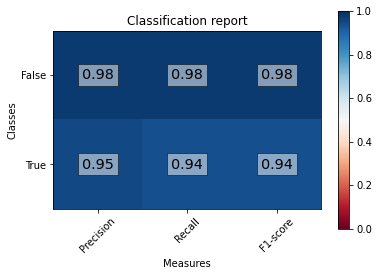

In [505]:
from sklearn import metrics as mt
cr=mt.classification_report(y_test,predictions_prob[:,1])
print(cr)
plot_classification_report(cr)

## ROC

<Figure size 720x360 with 0 Axes>

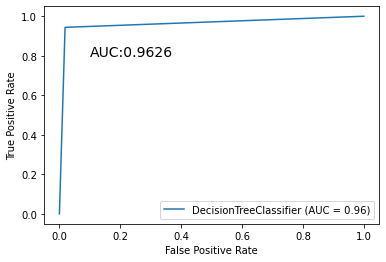

In [506]:
#import scikitplot as skplt
#from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
#false_positive_rate, true_positive_rate, thresholds = roc_curve(Y_test, clf1.predict_proba(y_test,predictions_prob)
auc =mt.roc_auc_score(y_test, predictions_prob[:,1])
plt.figure(figsize=(10,5))
mt.plot_roc_curve(clf1,X_test, y_test)
plt.text(0.1,0.8,"AUC:" + str(round(auc,4)),size = 14)
plt.show()


## Feature Importance (Global)

https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier.decision_path

In [507]:
# Option 1
clf1.feature_importances_

array([0.00329397, 0.        , 0.00053367, 0.03843715, 0.00275228,
       0.00303359, 0.01808466, 0.00135129, 0.00117285, 0.014921  ,
       0.00199384, 0.02129272, 0.01240118, 0.0010498 , 0.02003194,
       0.00740536, 0.14627591, 0.05634776, 0.02337201, 0.00176873,
       0.00518889, 0.01071719, 0.26999502, 0.01582744, 0.09967821,
       0.05902426, 0.05444906, 0.05284819, 0.05675201])

In [508]:
# Option 2
from sklearn.inspection import permutation_importance
importances = permutation_importance(clf1, X_train, y_train, n_repeats=10, random_state=0)
indices = np.argsort(importances.importances_mean)[::-1]

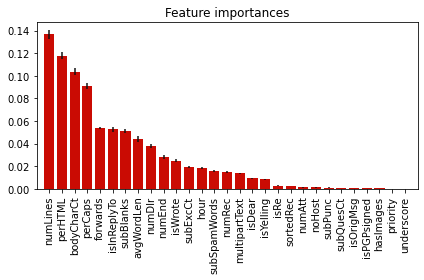

In [509]:
# https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html#sphx-glr-auto-examples-ensemble-plot-forest-importances-py
# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(
    range(X_train.shape[1]),
    importances.importances_mean[indices],
    color="r",
    yerr=importances.importances_std[indices],
    align="center"
)
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.tight_layout()
plt.show()

In [510]:
# https://scikit-learn.org/stable/auto_examples/tree/plot_iris_dtc.html#sphx-glr-auto-examples-tree-plot-iris-dtc-py
# Show a Grid with pairs of important predictors and pairs of not so good predictors

In [511]:
indices

array([16, 24, 17, 22, 26,  3, 25, 27, 28, 11, 15, 18, 23,  9, 21,  6, 14,
       12,  0,  4, 20, 10,  5, 19, 13,  8,  7,  2,  1], dtype=int64)

In [512]:
numericOrderedColNames = []
numericOrderedColIndices = []
for index in indices:
    columnName = X_train.columns[index]    
    if X_train[columnName].dtype == np.float64 or X_train[columnName].dtype == np.int64:         
        #print(f"{index}: {X_train.columns[index]} --> {X_train[columnName].dtype} --> Numeric")
        numericOrderedColNames.append(columnName)
        numericOrderedColIndices.append(index)
    else:
        #print(f"{index}: {X_train.columns[index]} --> {X_train[columnName].dtype} --> Not")
        pass

print("")
print(numericOrderedColNames)
print(numericOrderedColIndices)


['numLines', 'perHTML', 'bodyCharCt', 'perCaps', 'forwards', 'subBlanks', 'avgWordLen', 'numDlr', 'subExcCt', 'hour', 'numRec', 'numAtt', 'subQuesCt']
[16, 24, 17, 22, 26, 25, 27, 28, 18, 23, 21, 20, 19]


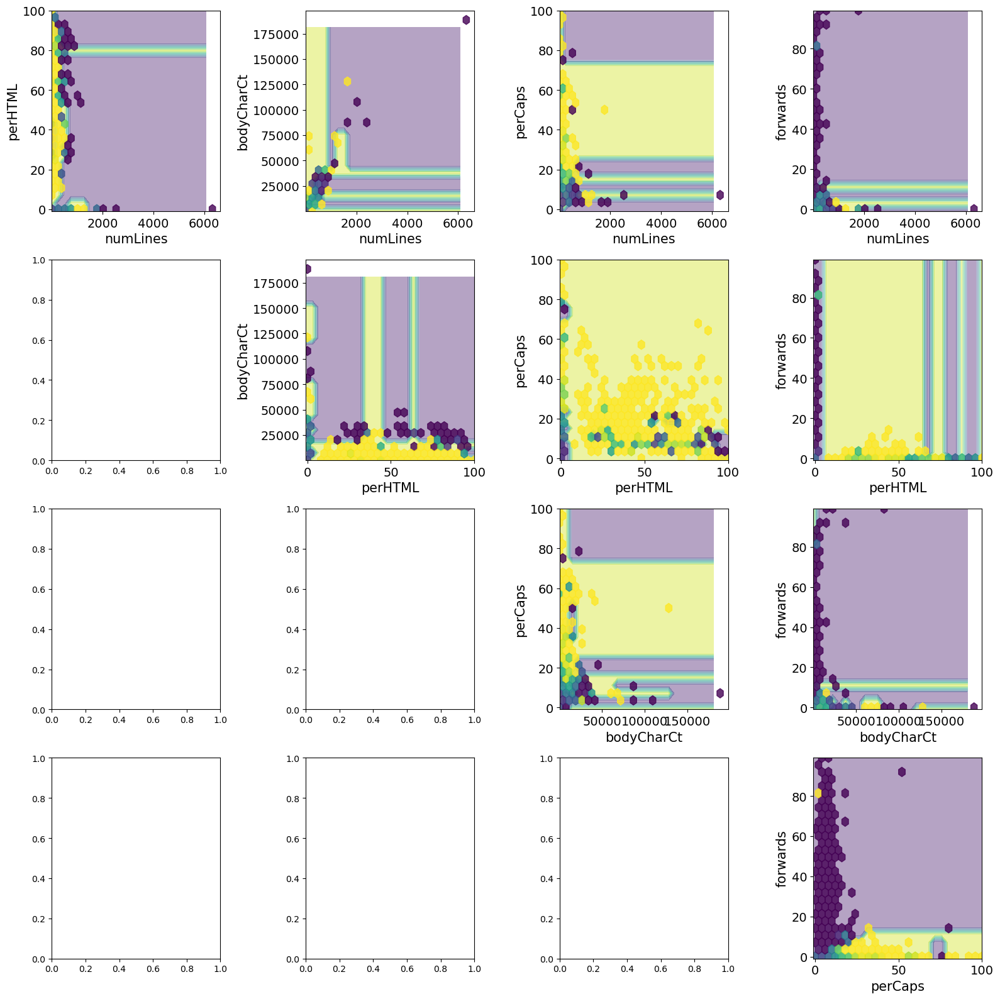

In [513]:
plt.style.use('default')
top = 5
fig, axes = plt.subplots(top-1, top-1, figsize=((top-1)*4, (top-1)*4))
for pairidx, pair_indices in enumerate(itertools.product(range(0, top), range(0, top))):
    if pair_indices[0] < pair_indices[1]:
        ax = axes[pair_indices[0], pair_indices[1]-1]
        colNames = X_train.columns[[numericOrderedColIndices[pair_indices[0]], numericOrderedColIndices[pair_indices[1]]]]
        _ = plot_decision_boundaries(
            X_train[colNames], y_train,
            DecisionTreeClassifier,
            feature_names=colNames,
            num_points=25,
            actual_only=False,
            ax = ax,
            random_state=42
        )
plt.tight_layout()
plt.show()

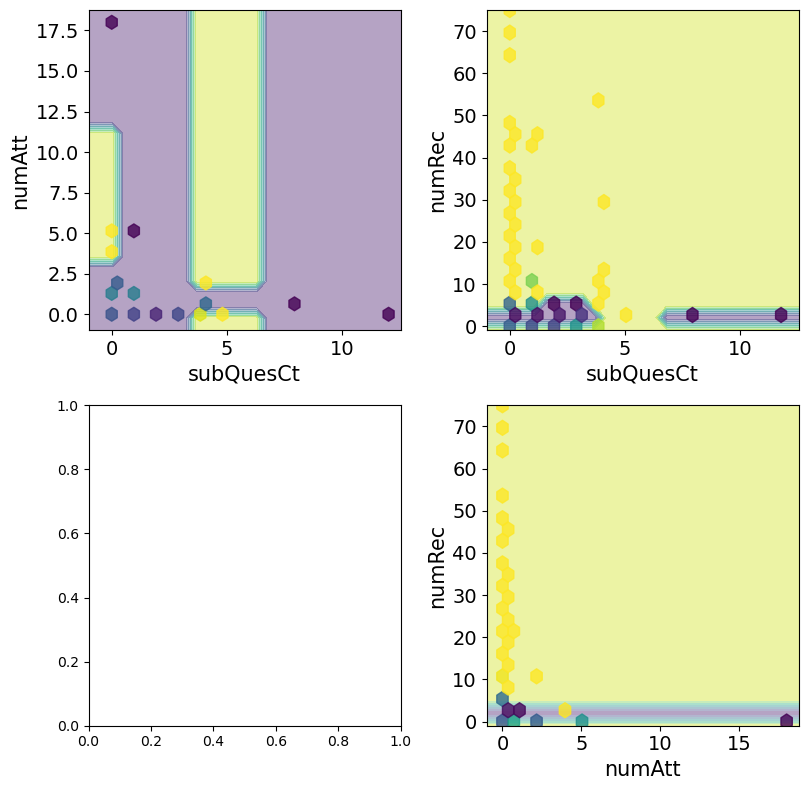

In [514]:
bottom = 3
fig, axes = plt.subplots(bottom-1, bottom-1, figsize=((bottom-1)*4, (bottom-1)*4))
for pairidx, pair_indices in enumerate(itertools.product(range(0, bottom), range(0, bottom))):
    if pair_indices[0] < pair_indices[1]:
        ax = axes[pair_indices[0], pair_indices[1]-1]
        colNames = X_train.columns[
            [numericOrderedColIndices[-(pair_indices[0]+1)], numericOrderedColIndices[-(pair_indices[1]+1)]]
        ]
        _ = plot_decision_boundaries(
            X_train[colNames], y_train,
            DecisionTreeClassifier,
            feature_names=colNames,
            num_points=25,
            actual_only=False,
            ax = ax,
            random_state=42
        )
plt.tight_layout()
plt.show()

## Tree Visualization

https://mljar.com/blog/visualize-decision-tree/

In [515]:
text_representation = tree.export_text(clf1)
#print(text_representation)

In [516]:
features = list(data.columns[1:])
print(features)

['isRe', 'underscore', 'priority', 'isInReplyTo', 'sortedRec', 'subPunc', 'multipartText', 'hasImages', 'isPGPsigned', 'subSpamWords', 'noHost', 'numEnd', 'isYelling', 'isOrigMsg', 'isDear', 'isWrote', 'numLines', 'bodyCharCt', 'subExcCt', 'subQuesCt', 'numAtt', 'numRec', 'perCaps', 'hour', 'perHTML', 'subBlanks', 'forwards', 'avgWordLen', 'numDlr']


In [517]:
# ?tree.plot_tree

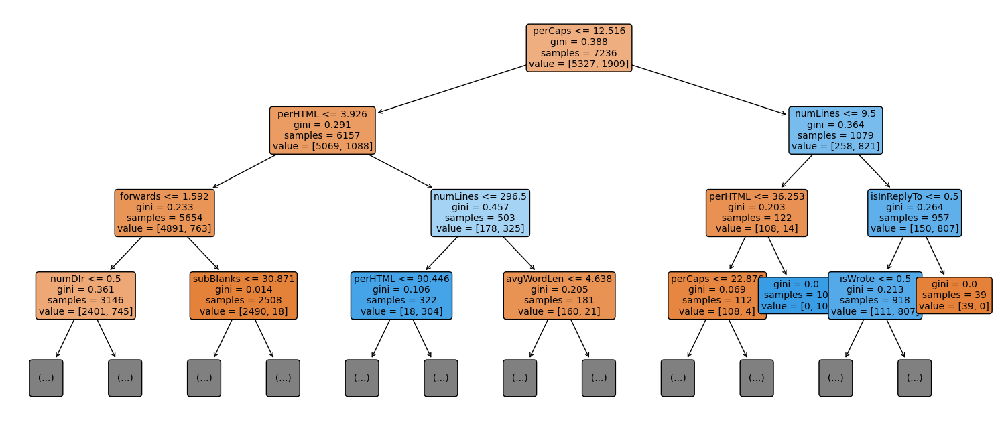

In [518]:
fig = plt.figure(figsize=(19,8))
_ = tree.plot_tree(
    clf1, 
    max_depth=3,
    feature_names=features, 
    fontsize=10,
    # class_names=['ham', 'spam'],
    filled=True, rounded=True
)

In [519]:
fig.savefig("decistion_tree.png")

In [520]:
import pydot
dot_data = StringIO()  
export_graphviz(clf1, out_file=dot_data, feature_names=features, filled=True, rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())
# plt.savefig('output.png', dpi=300)

In [521]:
# dotfile = open("./tree.dot", 'w')
# tree.export_graphviz(dtree, out_file = dotfile, feature_names = features)
# dotfile.close()

## Decision Path

In [522]:
clf1.decision_path(X_train.values[0].reshape(1,-1))

<1x589 sparse matrix of type '<class 'numpy.int64'>'
	with 10 stored elements in Compressed Sparse Row format>

In [523]:
# https://scikit-learn.org/stable/auto_examples/tree/plot_unveil_tree_structure.html#sphx-glr-auto-examples-tree-plot-unveil-tree-structure-py

# The decision estimator has an attribute called tree_  which stores the entire
# tree structure and allows access to low level attributes. The binary tree
# tree_ is represented as a number of parallel arrays. The i-th element of each
# array holds information about the node `i`. Node 0 is the tree's root. NOTE:
# Some of the arrays only apply to either leaves or split nodes, resp. In this
# case the values of nodes of the other type are arbitrary!
#
# Among those arrays, we have:
#   - left_child, id of the left child of the node
#   - right_child, id of the right child of the node
#   - feature, feature used for splitting the node
#   - threshold, threshold value at the node
#

# Using those arrays, we can parse the tree structure:

n_nodes = clf1.tree_.node_count
children_left = clf1.tree_.children_left
children_right = clf1.tree_.children_right
feature = clf1.tree_.feature
threshold = clf1.tree_.threshold

print(f" n_nodes: {n_nodes}")
# print(f" children_left: {children_left}")
# print(f" children_right: {children_right}")
# print(f" feature: {feature}")
# print(f" threshold: {threshold}")

 n_nodes: 589


In [524]:
# The tree structure can be traversed to compute various properties such
# as the depth of each node and whether or not it is a leaf.
node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
is_leaves = np.zeros(shape=n_nodes, dtype=bool)
stack = [(0, -1)]  # seed is the root node id and its parent depth
while len(stack) > 0:
    node_id, parent_depth = stack.pop()
    node_depth[node_id] = parent_depth + 1

    # If we have a test node
    if (children_left[node_id] != children_right[node_id]):
        stack.append((children_left[node_id], parent_depth + 1))
        stack.append((children_right[node_id], parent_depth + 1))
    else:
        is_leaves[node_id] = True

print(f"The binary tree structure has {n_nodes} nodes and has the following tree structure:")
for i in range(n_nodes):
    if is_leaves[i]:
        print("%snode=%s leaf node." % (node_depth[i] * " ", i))
    else:
        print("%snode=%s test node: go to node %s if X[:, %s] <= %s else to "
              "node %s."
              % (node_depth[i] * " ",
                 i,
                 children_left[i],
                 feature[i],
                 threshold[i],
                 children_right[i],
                 ))
print()

The binary tree structure has 589 nodes and has the following tree structure:
node=0 test node: go to node 1 if X[:, 22] <= 12.515614986419678 else to node 482.
 node=1 test node: go to node 2 if X[:, 24] <= 3.9264414310455322 else to node 449.
  node=2 test node: go to node 3 if X[:, 26] <= 1.5920854806900024 else to node 424.
   node=3 test node: go to node 4 if X[:, 28] <= 0.5 else to node 309.
    node=4 test node: go to node 5 if X[:, 25] <= 24.796239852905273 else to node 308.
     node=5 test node: go to node 6 if X[:, 18] <= 0.5 else to node 273.
      node=6 test node: go to node 7 if X[:, 6] <= 0.5 else to node 244.
       node=7 test node: go to node 8 if X[:, 14] <= 0.5 else to node 243.
        node=8 test node: go to node 9 if X[:, 11] <= 0.5 else to node 206.
         node=9 test node: go to node 10 if X[:, 12] <= 0.5 else to node 201.
          node=10 test node: go to node 11 if X[:, 27] <= 2.7698200941085815 else to node 12.
           node=11 leaf node.
           no

In [548]:
# Now, it's possible to get the tests that were used to predict a sample or
# a group of samples. First, let's make it for the sample.
sample_id = 0
plot_path(0, clf1, X_test,y_test)
#print(y)

Actual Classification: False
Rules used to predict sample 0: 
decision id node 0 : (X[0, 22 (perCaps)] (= 6.340058) <= 12.515614986419678)
decision id node 1 : (X[0, 24 (perHTML)] (= 0.0) <= 3.9264414310455322)
decision id node 2 : (X[0, 26 (forwards)] (= 53.84615) > 1.5920854806900024)
decision id node 424 : (X[0, 25 (subBlanks)] (= 14.814810000000001) <= 30.8712100982666)
decision id node 425 : (X[0, 27 (avgWordLen)] (= 3.9885059999999997) > 3.0593059062957764)
decision id node 427 : (X[0, 14 (isDear)] (= False) <= 0.5)
decision id node 428 : (X[0, 26 (forwards)] (= 53.84615) > 5.814739465713501)
decision id node 442 : (X[0, 6 (multipartText)] (= False) <= 0.5)
Predicted  Classification: [False]


In [526]:
plot_path(4, clf1, X_test,y_test)

Actual Classification: True
Rules used to predict sample 4: 
decision id node 0 : (X[4, 22 (perCaps)] (= 32.81818) > 12.515614986419678)
decision id node 482 : (X[4, 16 (numLines)] (= 130) > 9.5)
decision id node 488 : (X[4, 3 (isInReplyTo)] (= False) <= 0.5)
decision id node 489 : (X[4, 15 (isWrote)] (= False) <= 0.5)
decision id node 490 : (X[4, 17 (bodyCharCt)] (= 7695) <= 24116.0)
decision id node 491 : (X[4, 24 (perHTML)] (= 27.41228) > 4.237287998199463)
decision id node 575 : (X[4, 17 (bodyCharCt)] (= 7695) <= 19313.0)
decision id node 576 : (X[4, 17 (bodyCharCt)] (= 7695) <= 8664.0)
Predicted  Classification: [True]


In [527]:
plot_path(2, clf1, X_test,y_test)

Actual Classification: False
Rules used to predict sample 2: 
decision id node 0 : (X[2, 22 (perCaps)] (= 6.927175999999999) <= 12.515614986419678)
decision id node 1 : (X[2, 24 (perHTML)] (= 0.0) <= 3.9264414310455322)
decision id node 2 : (X[2, 26 (forwards)] (= 0.0) <= 1.5920854806900024)
decision id node 3 : (X[2, 28 (numDlr)] (= 0) <= 0.5)
decision id node 4 : (X[2, 25 (subBlanks)] (= 18.181820000000002) <= 24.796239852905273)
decision id node 5 : (X[2, 18 (subExcCt)] (= 0.0) <= 0.5)
decision id node 6 : (X[2, 6 (multipartText)] (= False) <= 0.5)
decision id node 7 : (X[2, 14 (isDear)] (= False) <= 0.5)
decision id node 8 : (X[2, 11 (numEnd)] (= False) <= 0.5)
decision id node 9 : (X[2, 12 (isYelling)] (= False) <= 0.5)
decision id node 10 : (X[2, 27 (avgWordLen)] (= 4.468254) > 2.7698200941085815)
decision id node 12 : (X[2, 9 (subSpamWords)] (= False) <= 0.5)
decision id node 13 : (X[2, 21 (numRec)] (= 2.0) > 0.5)
decision id node 17 : (X[2, 27 (avgWordLen)] (= 4.468254) <= 5.26

In [528]:
y_test.head()

1263    False
93      False
3452    False
6292    False
8102     True
Name: isSpam, dtype: bool

In [529]:
sample_ids = [0, 0]
_ = find_common_nodes(sample_ids, clf1, X_test, verbose=1)

sample_ids = [0, 1]
_ = find_common_nodes(sample_ids, clf1, X_test, verbose=1)

sample_ids = [0, 2]
_ = find_common_nodes(sample_ids, clf1, X_test, verbose=1)

sample_ids = [2, 3]
_ = find_common_nodes(sample_ids, clf1, X_test, verbose=1)

sample_ids = [1, 5]
_ = find_common_nodes(sample_ids, clf1, X_test, verbose=1)


The following samples [0, 0] share the node [  0   1   2 424 425 427 428 442 443] in the tree
It is 100.0 % of nodes in any of these sample paths.
It is 1.5280135823429541 % of all nodes.

The following samples [0, 1] share the node [0 1 2] in the tree
It is 12.0 % of nodes in any of these sample paths.
It is 0.5093378607809848 % of all nodes.

The following samples [0, 2] share the node [0 1 2] in the tree
It is 11.11111111111111 % of nodes in any of these sample paths.
It is 0.5093378607809848 % of all nodes.

The following samples [2, 3] share the node [0 1 2] in the tree
It is 11.11111111111111 % of nodes in any of these sample paths.
It is 0.5093378607809848 % of all nodes.

The following samples [1, 5] share the node [ 0  1  2  3  4  5  6  7  8  9 10 12 13 17] in the tree
It is 45.16129032258065 % of nodes in any of these sample paths.
It is 2.3769100169779285 % of all nodes.


In [530]:
class_vals = y_train.unique()
class_vals

array([ True, False])

In [531]:
size = int(len(X_test)/20)
common_array = np.zeros((size, size))
both_true_array = np.zeros((size, size))
both_false_array = np.zeros((size, size))
one_true_one_false = np.zeros((size, size))
print(common_array.shape)
for i in np.arange(0, size):
    for j in np.arange(0, size):
        common_array[i, j], _ = find_common_nodes([i, j], clf1, X_test, verbose=0)
        if y_test.values[i] == y_test.values[j]:
            if y_test.values[i]:
                both_true_array[i, j] = 1
            else:
                both_false_array[i, j] = 1
        else:
            one_true_one_false[i, j] = 1        

(90, 90)


In [532]:
common_array

array([[100.        ,  12.        ,  11.11111111, ...,  25.        ,
         15.        ,  13.33333333],
       [ 12.        , 100.        ,  53.84615385, ...,  19.04761905,
         13.79310345,   8.        ],
       [ 11.11111111,  53.84615385, 100.        , ...,  17.39130435,
         12.90322581,   7.40740741],
       ...,
       [ 25.        ,  19.04761905,  17.39130435, ..., 100.        ,
         33.33333333,  16.66666667],
       [ 15.        ,  13.79310345,  12.90322581, ...,  33.33333333,
        100.        ,  10.        ],
       [ 13.33333333,   8.        ,   7.40740741, ...,  16.66666667,
         10.        , 100.        ]])

In [533]:
print(both_true_array.sum())
both_true_array

729.0


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [534]:
print(both_false_array.sum())
both_false_array

3969.0


array([[1., 1., 1., ..., 1., 1., 0.],
       [1., 1., 1., ..., 1., 1., 0.],
       [1., 1., 1., ..., 1., 1., 0.],
       ...,
       [1., 1., 1., ..., 1., 1., 0.],
       [1., 1., 1., ..., 1., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [535]:
print(one_true_one_false.sum())
one_true_one_false

3402.0


array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [1., 1., 1., ..., 1., 1., 0.]])

In [536]:
common_true = (common_array * both_true_array).reshape(-1)
common_true = common_true[(common_true != 0) & (common_true != 100)]
common_false = (common_array * both_false_array).reshape(-1)
common_false = common_false[(common_false != 0) & (common_false != 100)]
common_both = (common_array * one_true_one_false).reshape(-1)
common_both = common_both[(common_both != 0) & (common_both != 100)]

In [537]:
print(np.sum(common_true != 0))
print(np.sum(common_false != 0))
print(np.sum(common_both != 0))

640
3080
3402


In [538]:
common_true = pd.DataFrame({'type': 'BothTrue', 'PercentCommon':common_true})
common_false = pd.DataFrame({'type': 'BothFalse', 'PercentCommon':common_false})
common_both = pd.DataFrame({'type': 'OneTrueOneFalse', 'PercentCommon':common_both})

In [539]:
frames = [common_true, common_false, common_both]
all_common = pd.concat(frames)

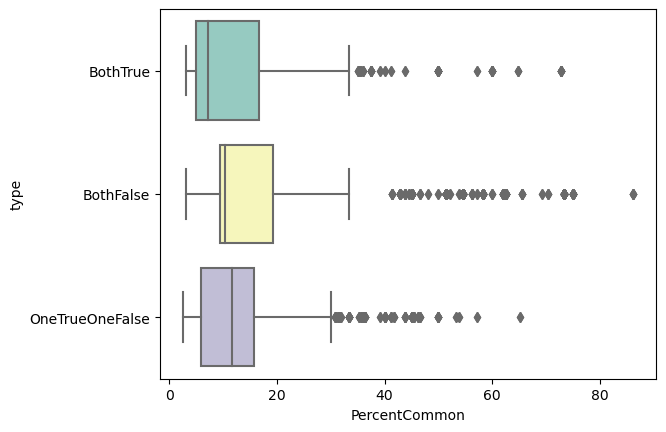

In [540]:
ax = sns.boxplot(y="type", x="PercentCommon",
                 data=all_common, palette="Set3")

# A Simple Tree

In [541]:
clf2 = DecisionTreeClassifier(max_depth=3)
cross_val_score(clf2, X_train, y_train, scoring='f1', cv=10)

array([0.69009585, 0.70163934, 0.71028037, 0.67532468, 0.73520249,
       0.65100671, 0.64951768, 0.62798635, 0.73125   , 0.7284345 ])

In [542]:
clf2.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

In [543]:
predictions = clf2.predict(X_test)

## Tree Visualization

https://mljar.com/blog/visualize-decision-tree/

In [544]:
text_representation = tree.export_text(clf2)
#print(text_representation)

In [545]:
features = list(data.columns[1:])
print(features)

['isRe', 'underscore', 'priority', 'isInReplyTo', 'sortedRec', 'subPunc', 'multipartText', 'hasImages', 'isPGPsigned', 'subSpamWords', 'noHost', 'numEnd', 'isYelling', 'isOrigMsg', 'isDear', 'isWrote', 'numLines', 'bodyCharCt', 'subExcCt', 'subQuesCt', 'numAtt', 'numRec', 'perCaps', 'hour', 'perHTML', 'subBlanks', 'forwards', 'avgWordLen', 'numDlr']


In [546]:
# ?tree.plot_tree

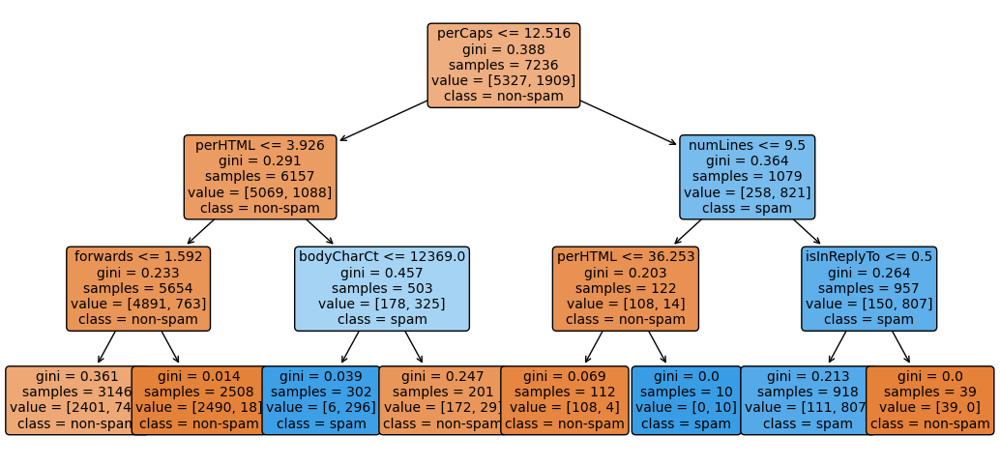

In [547]:
fig = plt.figure(figsize=(13,6))
_ = tree.plot_tree(
    clf2, 
    max_depth=9,
    feature_names=features, 
    fontsize=10,
    class_names=['non-spam', 'spam'],
    filled=True, rounded=True
)